# Read, Visualize and Clean data

Four databases are provided, each corresponding to a Senvion MM82 wind turbine with nominal Rated power of 2050 kW, namely R80711, R80736, R80721 and R80790.

Let us choose one database and analyse it (eg. R80711).

Several tests are performed to demonstrate data analysis on this database. 

In [1]:
from pathlib import Path
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt 

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

from windml.core.functions import load_one

data_dir = Path.cwd().parent / 'windml' / 'data'
turbine_name = 'R80711'
turbine_csv_file = Path(data_dir, f'{turbine_name}.csv')

df = load_one(turbine_csv_file)

Loading time: 1.56 seconds.
Memory usage: 63.67 MB.
261812 Lines found.


<Axes: xlabel='Date_time'>

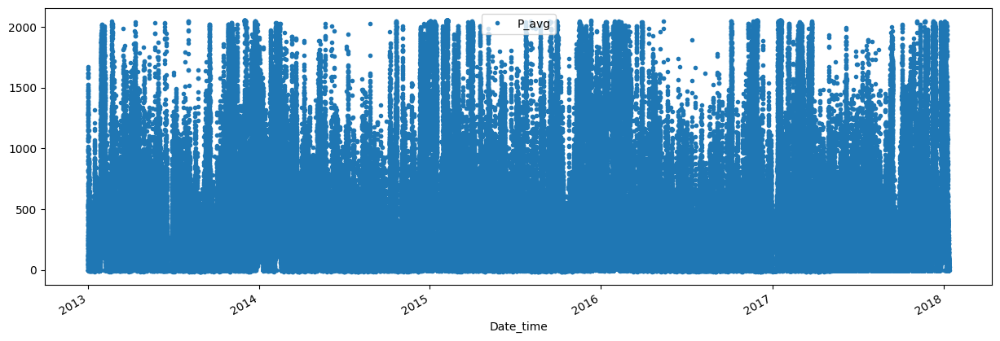

In [2]:
color_pal = sns.color_palette()
df.plot(style='.', y='P_avg', figsize=(15,5), color=color_pal[0])

## 1.1 Check for emtpy features

Preliminary check to locate and remove empty columns. 
**Conclusion** There is no empty column, so we can keep all features.

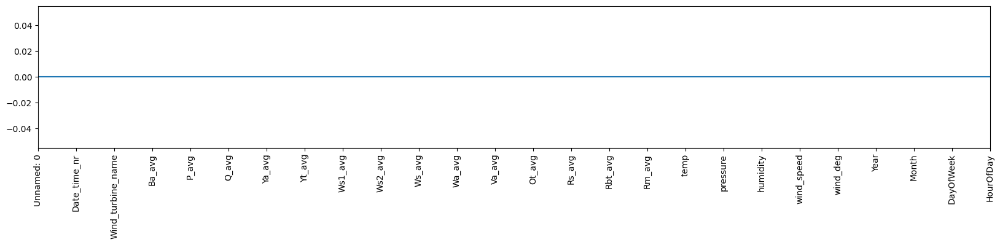

In [3]:
plt.figure(figsize=(20,3))
plt.plot(df.isnull().sum(axis = 0))
plt.xticks(rotation=90)
plt.margins(x=0)
plt.show()

## 1.2 Check uniformity of Database with respect to month, day and hour

Preliminary check to analyse the distribution and uniformity of data over time. Often database could be incomplete or sparse. **Conclusion** The distribution of data is uniform.

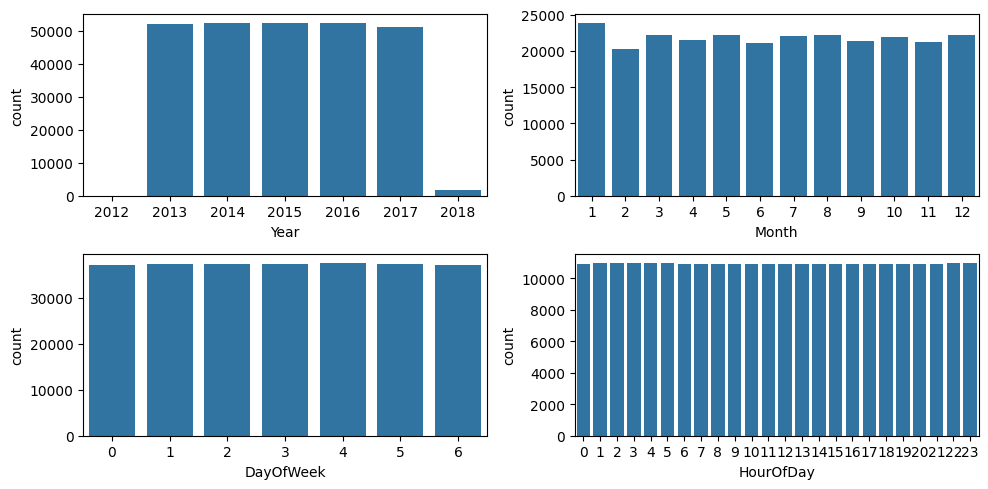

In [4]:
fig, ax = plt.subplots(2, 2, figsize=(10, 5))
sns.countplot(x='Year', data=df, ax=ax[0,0])
sns.countplot(x='Month', data=df, ax=ax[0,1])
sns.countplot(x='DayOfWeek', data=df, ax=ax[1,0])
sns.countplot(x='HourOfDay', data=df, ax=ax[1,1])

plt.tight_layout()

## 1.3 Exploratory Data Analysis (EDA)

Check distribution of numerical (non time-related) database entries for visual outliers detection.

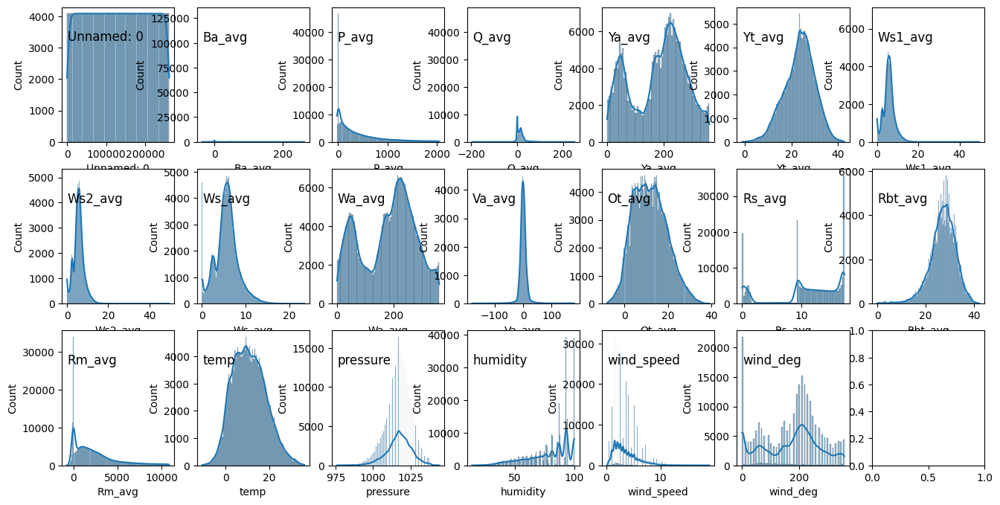

In [5]:
# Plot distribution for each column
# Let us exclude columns which are not relevant:
#   - 'Date_time', 
#   - 'Date_time_nr',
#   - 'Wind_turbine_name',
#   - 'Year',
#   - 'Month', 
#   - 'DayOfWeek', 
#   - 'HourOfDay'


tmp_df = df.drop(columns=[ 'Date_time_nr', 'Wind_turbine_name', 
                          'Year', 'Month', 'DayOfWeek', 'HourOfDay'])

ncols = 3
nrows = 7

fig, ax = plt.subplots(ncols, nrows, figsize=(16, 8))

for cc, column in enumerate(tmp_df.columns):

    cc_ax = ax[cc//nrows, cc%nrows]
    cc_ax.text(x=0.05, y=.75, s=column, fontsize=12, transform=cc_ax.transAxes)
    
    # For categorical data
    if tmp_df[column].dtype == 'object':  
        sns.countplot(x=column, data=df, ax=cc_ax)

    # For numerical data
    else:  
        sns.histplot(tmp_df[column], kde=True, ax=cc_ax)


### ROSE WIND analysis

- Most wind comes in from the S-W direction
- Stronger wind comes in form the S-W direction

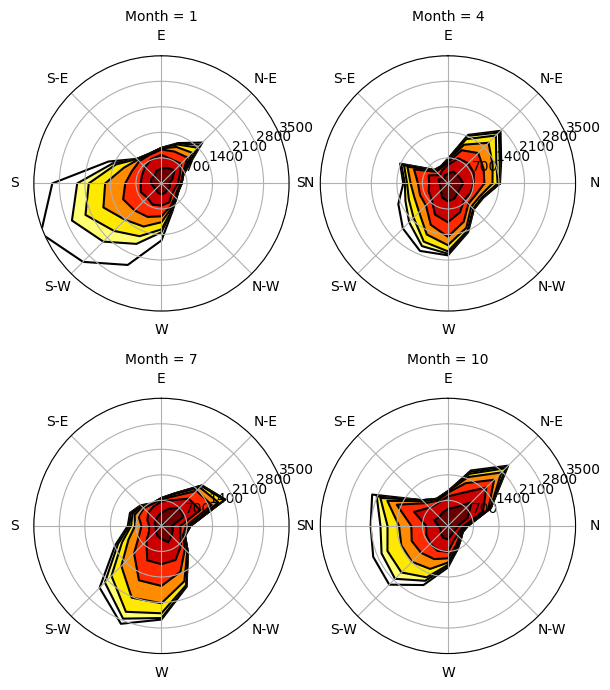

In [6]:
from windml.core.functions import select_time_subset
from windml.visualization.custom_plots import plot_windrose_subplots


# Filter DataFrame to include only January, April, July, and October
df_filtered = df[df["Month"].isin([1, 4, 7, 10])]

# Create the raw subplot structure with a subplot per value in month
g = sns.FacetGrid(
    data=df_filtered,
    col="Month",
    col_wrap=2,  # Adjust the number of plots per row as needed
    subplot_kws={"projection": "windrose"},
    sharex=False,
    sharey=False,
    despine=False,
    height=3.5,
)

g.map_dataframe(
    plot_windrose_subplots,
    direction="Wa_avg",
    var="wind_speed",
)

# Adjust the spacing between the subplots to have sufficient space between plots
plt.subplots_adjust(wspace=-0.2)
plt.savefig('windrose.jpeg')
plt.savefig('windrose.png')
plt.show()

## 1.4 Features analysis

### Pitch_angle (Ba_avg) - Find univariate outliers using box plots

- The angle between the plane of the rotor blade and the oncoming wind. It's a critical parameter for controlling the operation and efficiency of wind turbines
- Its values are typically of a few degrees 
- For high wind speed and power output, the turbine control system pitches (turns) the rotor blades out of the wind
- Under extreme conditions, the pitch angle is utilized to minimize or stall the power production of a wind turbine
  
**Conclusions**
- Discretization issue with 'Ba_avg' -> introducing 'rounded_Ba_avg'
- Removing outliers (keeping only -5 < Ba < 5)

In [7]:
import plotly.express as px

px.box(df, y="Ba_avg")

In [8]:
# Remove all entries with too large pitching angle 
ba_threshold = 15.
copy_df = df.loc[ ( df.Ba_avg > -ba_threshold ) & ( df.Ba_avg < ba_threshold ) ]
print(f'Removing {(1-len(copy_df)/len(df))*100:2.2f}% of the lines,')
print(f'{len(df)-len(copy_df)} rows were removed')

Removing 18.76% of the lines,
49126 rows were removed


In [9]:
# Discretization issue with Ba_avg
copy_df['Ba_avg'].value_counts()

Ba_avg
-0.99    97188
-0.99    17680
-1.00     8115
-0.97     7737
-0.96     7224
         ...  
 2.15        1
 6.33        1
 7.06        1
 2.94        1
 7.69        1
Name: count, Length: 2076, dtype: int64

In [10]:
# Round Ba
num_decimal_places = 6
copy_df.loc[:, 'rounded_Ba_avg'] = copy_df['Ba_avg'].round(num_decimal_places)

/tmp/ipykernel_114127/1165234790.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



### Vane_position - is it normally distributed?

The Kolmogorov-Smirnov (KS) Statistic measures the maximum distance between the empirical cumulative distribution function (ECDF) of the sample data and the cumulative distribution function (CDF) of the reference distribution (in this case, a normal distribution). 

Essentially, it quantifies the largest discrepancy between the observed distribution of your sample data and the expected distribution if the null hypothesis were true.

### Result

Va_avg - KS Statistic: 0.7968, P-value: 0.0000 

A large KS Statistic value suggests a significant deviation between the sample distribution and the reference distribution.

A p-value significantly less than 0.05 leads to reject the null hypothesis: the data do not come from a normal distribution. 

In [11]:
import math
from scipy.stats import kstest

variable = 'temp'
## Select postitive values
#positive_Va_avg = df.loc[ df.Va_avg > 0 ].Va_avg.values

# Perform the Kolmogorov-Smirnov test for normality on the uniformly distributed data
ks_statistic, p_value = kstest(df[variable], 'norm')

print(f"{variable} - KS Statistic: {ks_statistic:.4f}, P-value: {p_value:.4f}")

temp - KS Statistic: 0.8553, P-value: 0.0000


# 1.5 Feature Correlation and Selection


### Multivariate Analysis

A visual analysis is performed to highlight correlation on variables that are relevant to the physics of the problem

- produced power vs wind speed: positive correlation
- produced power vd pitch angle: negative correlation


<Axes: xlabel='wind_speed', ylabel='P_avg'>

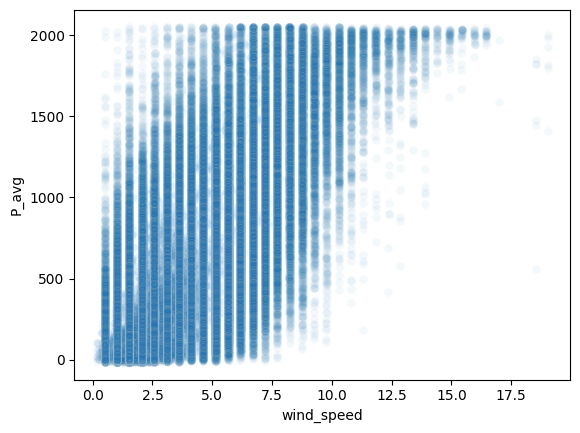

In [12]:
# WIND-POWER curve - positive correlation
# A typical s-shaped is found, although too many values of P_avg=0

sns.scatterplot(
    x=copy_df.wind_speed,
    y=copy_df.P_avg, 
    alpha=0.05)

<Axes: xlabel='Ba_avg', ylabel='P_avg'>

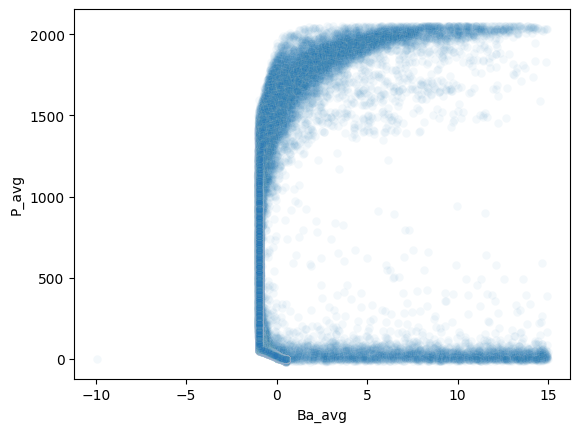

In [13]:
# negative correlation

sns.scatterplot(
    x=copy_df.Ba_avg, 
    y=copy_df.P_avg,
    alpha=0.05)

### Correlation matrix

The correlation matrix helps identify relationships between features and select the best of them to maximise ML results. In this case the target variables are: rotor torque, converter torque and/or power output.

### We want to choose variable that are:
- Strongly correlated with the target variables => These are likely to be good predictors
- Low or moderate correlation with each other => Avoid multicollinearity, which can destabilize predictive models.
- Meaningful relationships with the problem domain => Variables with a clear and interpretable relationship with the targets are more likely to improve model performance

### Conclusion
- P_avg and Rm_avg are strongly correlated
- Ws_avg, Ws2_avg and Ws1_avg are too correlated one another
- Rs_avg = rotor speed
- what is the difference between wind_speed and Ws_avg?
All other varialbles will be ignored (too small correlation)

In [14]:
copy_df.columns

Index(['Unnamed: 0', 'Date_time_nr', 'Wind_turbine_name', 'Ba_avg', 'P_avg',
       'Q_avg', 'Ya_avg', 'Yt_avg', 'Ws1_avg', 'Ws2_avg', 'Ws_avg', 'Wa_avg',
       'Va_avg', 'Ot_avg', 'Rs_avg', 'Rbt_avg', 'Rm_avg', 'temp', 'pressure',
       'humidity', 'wind_speed', 'wind_deg', 'Year', 'Month', 'DayOfWeek',
       'HourOfDay', 'rounded_Ba_avg'],
      dtype='object')

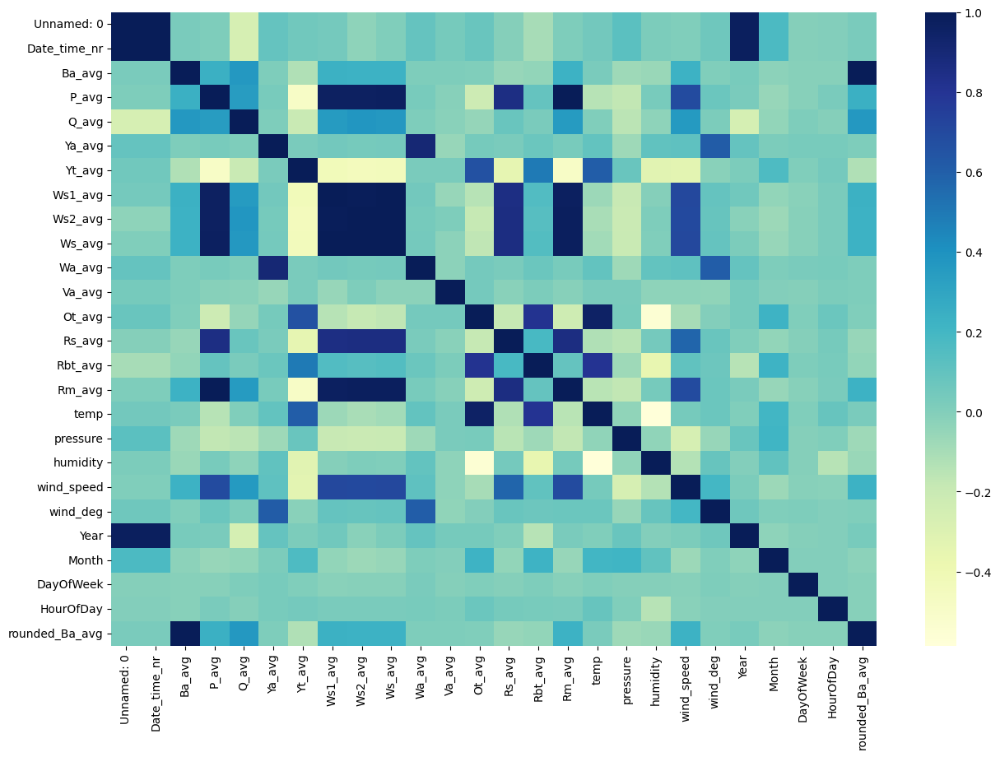

In [15]:
#Torque = Rm_avg
#Active Power = P_avg

clear_df = copy_df.drop(columns=['Wind_turbine_name'])

correlation_matrix = clear_df.corr()
plt.subplots(figsize=(15,10))
sns.heatmap(correlation_matrix, cmap="YlGnBu" )
plt.savefig('heatmap.jpeg')

In [16]:
from windml.core.functions import find_highly_correlated_variables

find_highly_correlated_variables(correlation_matrix, 'P_avg', 0.0)

,Variable,Correlation
0,Rm_avg,0.998348
1,Ws_avg,0.971011
2,Ws2_avg,0.969014
3,Ws1_avg,0.968452
4,Rs_avg,0.854949
5,wind_speed,0.692910
6,Yt_avg,0.489963
7,Q_avg,0.349250
8,Ba_avg,0.240247
9,rounded_Ba_avg,0.240247


In [17]:
find_highly_correlated_variables(correlation_matrix, 'Rm_avg', 0.1)

,Variable,Correlation
0,P_avg,0.998348
1,Ws_avg,0.977900
2,Ws2_avg,0.976046
3,Ws1_avg,0.975171
4,Rs_avg,0.859461
5,wind_speed,0.693237
6,Yt_avg,0.487142
7,Q_avg,0.353171
8,Ba_avg,0.228176
9,rounded_Ba_avg,0.228176
